In [40]:
import numpy as np
import numpy.matlib
import seaborn as sns

from matplotlib import pyplot as plt
import math
import time

In [41]:
from keras.datasets import mnist

In [42]:
def getEuclideanDistance(single_point,array):
    nrows, ncols, nfeatures=array.shape[0],array.shape[1], array.shape[2]
    points=array.reshape((nrows*ncols,nfeatures))
                         
    dist = (points - single_point)**2
    dist = np.sum(dist, axis=1)
    dist = np.sqrt(dist)

    dist=dist.reshape((nrows,ncols))
    return dist

In [43]:

mu, sigma = 0, 0.1
A = np.random.normal(mu, sigma, 10)
#A.shape, A

In [44]:
nrows,ncols,nfeatures=3,3,3

#Generate coordinate system
x,y=np.meshgrid(range(ncols),range(nrows))

In [45]:

sgm0=2
sgmdecay=0.05
t=1
sgm = sgm0 * math.exp(-t*sgmdecay);

width = math.ceil(sgm*3)

dist=np.array([[2,1,3],[3,2,3],[4,4,4]])
bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) 

g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));


fromrow = max(0,bmurow - width);
torow   = min(bmurow + width,nrows);
fromcol = max(0,bmucol - width);
tocol   = min(bmucol + width,ncols);



In [47]:
G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);



In [48]:
def SOM (dispRes, trainingData, ndim=10, nepochs=10, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    mu, sigma = 0, 0.1
    numpy.random.seed(int(time.time()))
    som = np.random.normal(mu, sigma, (nrows,ncols,nfeatures))

    if showMode >= 1:
        print("\nSOM features before training: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
                ax[k,l].set_xticks([])   
    
    #Generate coordinate system
    x,y=np.meshgrid(range(ncols),range(nrows))
    
    
    for t in range (1,nepochs+1):
        #Compute the learning rate for the current epoch
        eta = eta0 * math.exp(-t*etadecay);
        
        #Compute the variance of the Gaussian (Neighbourhood) function for the ucrrent epoch
        sgm = sgm0 * math.exp(-t*sgmdecay);
        
        #Consider the width of the Gaussian function as 3 sigma
        width = math.ceil(sgm*3);
        
        for ntraining in range(ntrainingvectors):
            trainingVector = trainingData[ntraining,:];
            
            # Compute the Euclidean distance between the training vector and
            # each neuron in the SOM map
            dist = getEuclideanDistance(trainingVector, som);
       
            # Find 2D coordinates of the Best Matching Unit (bmu)
            bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
            
            
            #Generate a Gaussian function centered on the location of the bmu
            g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));

            #Determine the boundary of the local neighbourhood
            fromrow = max(0,bmurow - width);
            torow   = min(bmurow + width,nrows);
            fromcol = max(0,bmucol - width);
            tocol   = min(bmucol + width,ncols);

            
            #Get the neighbouring neurons and determine the size of the neighbourhood
            neighbourNeurons = som[fromrow:torow,fromcol:tocol,:];
            sz = neighbourNeurons.shape;
            
            #Transform the training vector and the Gaussian function into 
            # multi-dimensional to facilitate the computation of the neuron weights update
            T = np.matlib.repmat(trainingVector,sz[0]*sz[1],1).reshape((sz[0],sz[1],nfeatures));                   
            G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);

            # Update the weights of the neurons that are in the neighbourhood of the bmu
            neighbourNeurons = neighbourNeurons + eta * G * (T - neighbourNeurons);

            
            #Put the new weights of the BMU neighbouring neurons back to the
            #entire SOM map
            som[fromrow:torow,fromcol:tocol,:] = neighbourNeurons;
        if t == math.floor(nepochs/2):
            if showMode >= 1:
                print("\nSOM intermediate  training: \n")
                
                fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
                
                for k in range(nrows):
                    for l in range (ncols):
                        A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                        ax[k,l].imshow(A,cmap="plasma")
                        ax[k,l].set_yticks([])
                    ax[k,l].set_xticks([])   

    if showMode >= 1:
        print("\nSOM features AFTER training: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
            ax[k,l].set_xticks([])   
    return som
    

In [13]:
import pandas as pd
def parse_input_zoo_data(filename, header='infer'):

    input_data = pd.read_csv(filename, header=header)

    classes = input_data[17].tolist()
    labels = input_data[0].tolist()
    input_database = {
        0: input_data.to_numpy([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16])
    }

    return input_database, labels, classes

In [14]:
input_filename = 'dataset/zoo.txt'
input_vector_database, labels, classes = parse_input_zoo_data(input_filename,None)







TypeError: Field elements must be 2- or 3-tuples, got '1'

In [ ]:
#som_trained=SOM ([4,4],input_vector_database[0], ndim=10, nepochs=100, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)


In [ ]:
plt.show()


In [49]:
#verification of correctness on the training set:



def SOM_Test (trainingData, som_, classes, grid_, ConfusionMatrix, ndim=60):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    nclasses=np.max(classes)

    som_cl=np.zeros((ndim,ndim,nclasses+1))
    
    
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        
        som_cl[bmurow, bmucol,class_of_sample]=som_cl[bmurow, bmucol,class_of_sample]+1
    
    
    
    for i in range (nrows):
        for j in range (ncols):
            grid_[i,j]=np.argmax(som_cl[i,j,:])

 
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        predicted=np.argmax(som_cl[bmurow, bmucol,:])
        ConfusionMatrix[class_of_sample-1, predicted-1]=ConfusionMatrix[class_of_sample-1, predicted-1]+1
        
    return grid_, ConfusionMatrix
    



In [ ]:
ndim=10
nrows=ndim
ncols=ndim
grid_color=np.zeros((nrows,ncols))
nclasses=np.max(classes)

Confusion_Matrix=np.zeros((nclasses,nclasses))
grid_color,Confusion_Matrix=SOM_Test (input_vector_database[0], som_trained, classes, grid_color, Confusion_Matrix, ndim)




NameError: name 'classes' is not defined

In [ ]:
plt.close()
plt.imshow(grid_color)
plt.show()

In [ ]:
#Confusion_Matrix, input_vector_database[0].shape, np.sum(Confusion_Matrix)

1.1
-----

(60000, 28, 28)


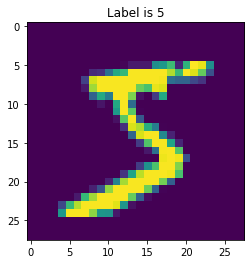

In [50]:
(Xtr, Ltr), (test_Data, test_Label)=mnist.load_data()

print(Xtr.shape)
Image=Xtr[0,:,:]
Label=Ltr[0]

plt.title('Label is {Label}'.format(Label=Label))
plt.imshow(Image)

plt.show()
plt.close()

1.2
------

In [51]:
def flattenArray(num_sample, dTrain, lTrain, dTest, lTest):
    backDTrain=dTrain[:num_sample,:,:]
    backDTest=dTest[:num_sample,:,:]
    return(backDTrain.reshape(num_sample,backDTrain.shape[1]*backDTrain.shape[2]).astype(int),lTrain[:num_sample], 
            backDTest.reshape(num_sample,backDTest.shape[1]*backDTest.shape[2]).astype(int),lTest[:num_sample])



num_sample=100
d_Train, l_Train, d_test, l_test = flattenArray(num_sample,Xtr,Ltr,test_Data,test_Label)
print(d_Train.shape)
print(l_Train.shape)
print(d_test.shape)
print(l_test.shape)




(100, 784)
(100,)
(100, 784)
(100,)


1.3
----------


SOM features before training: 


SOM intermediate  training: 


SOM features AFTER training: 



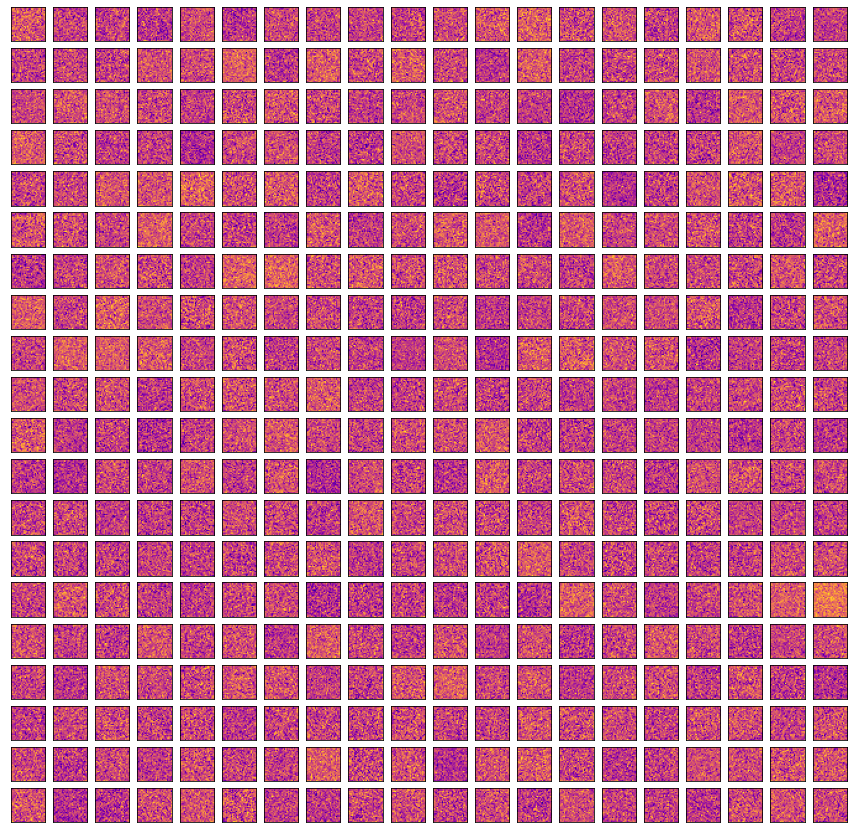

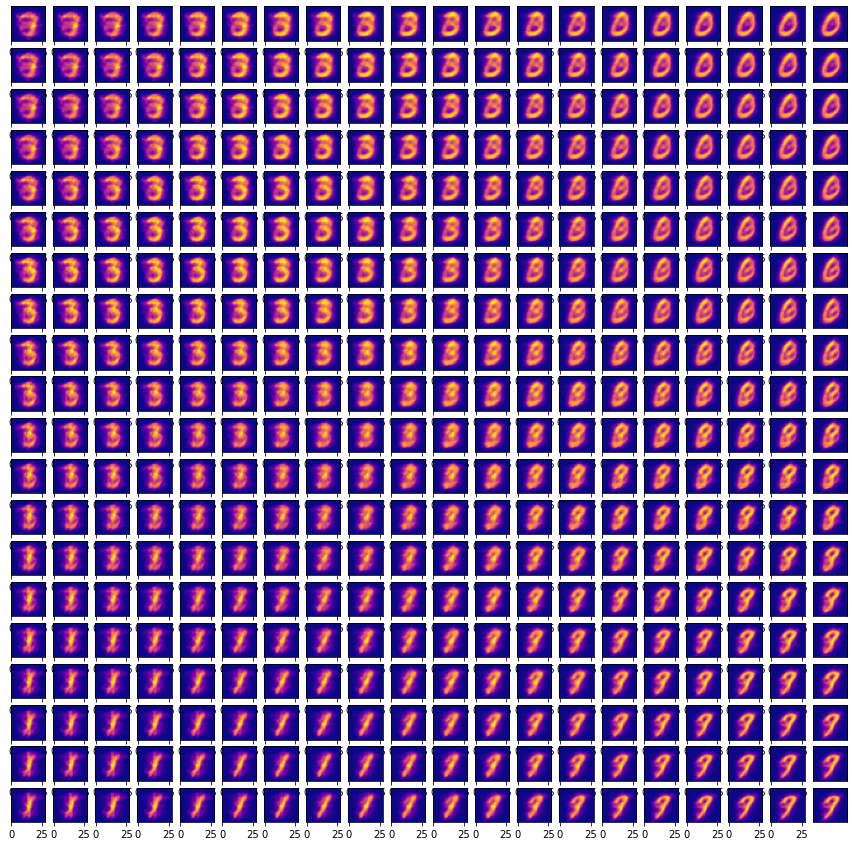

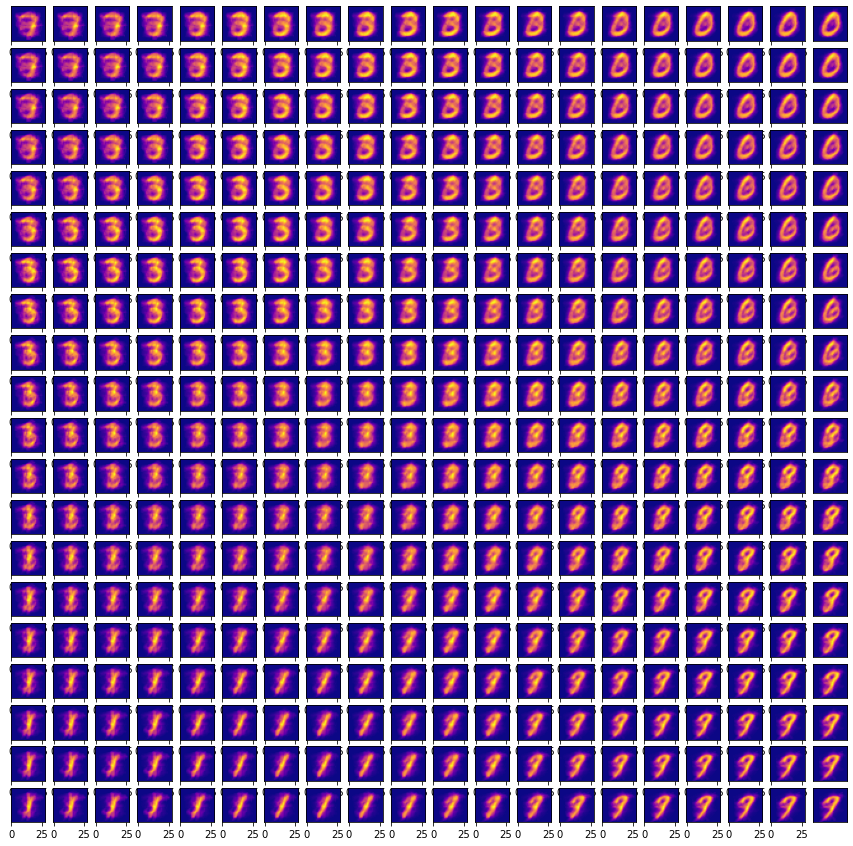

In [17]:
#eta0 = learningrate

som_trained_20_20 = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)



SOM features before training: 


SOM intermediate  training: 


SOM features AFTER training: 



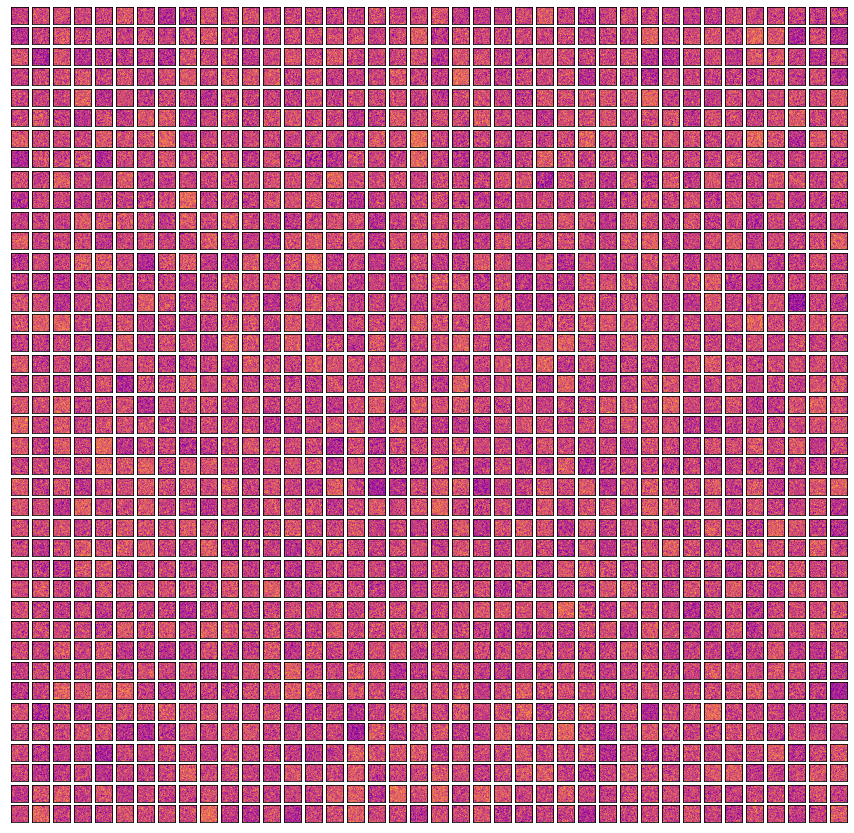

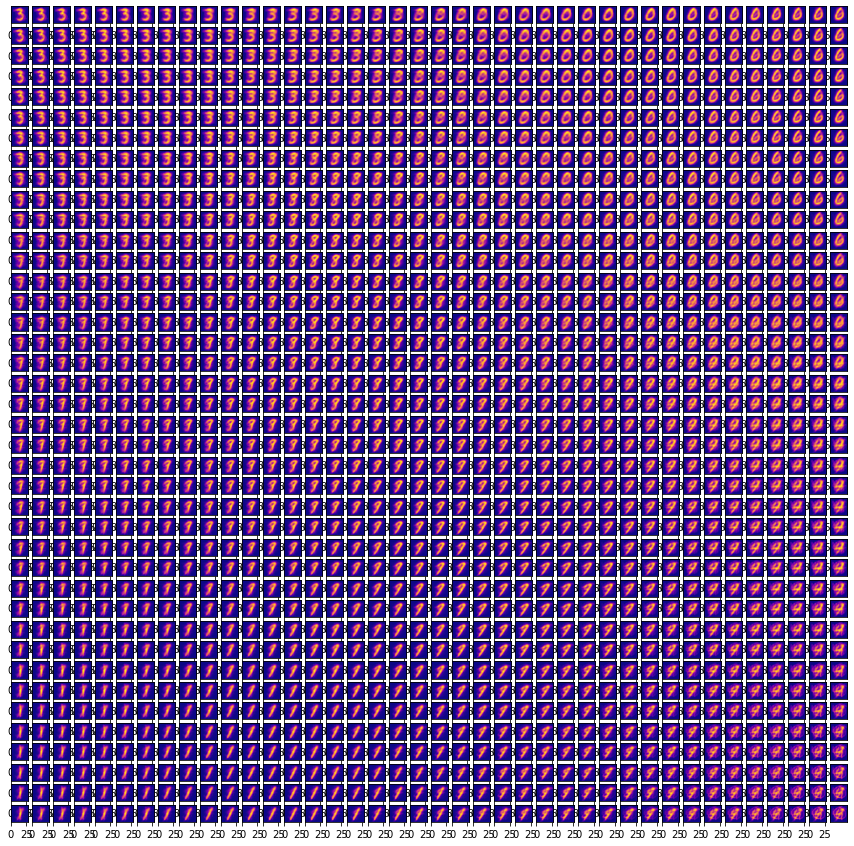

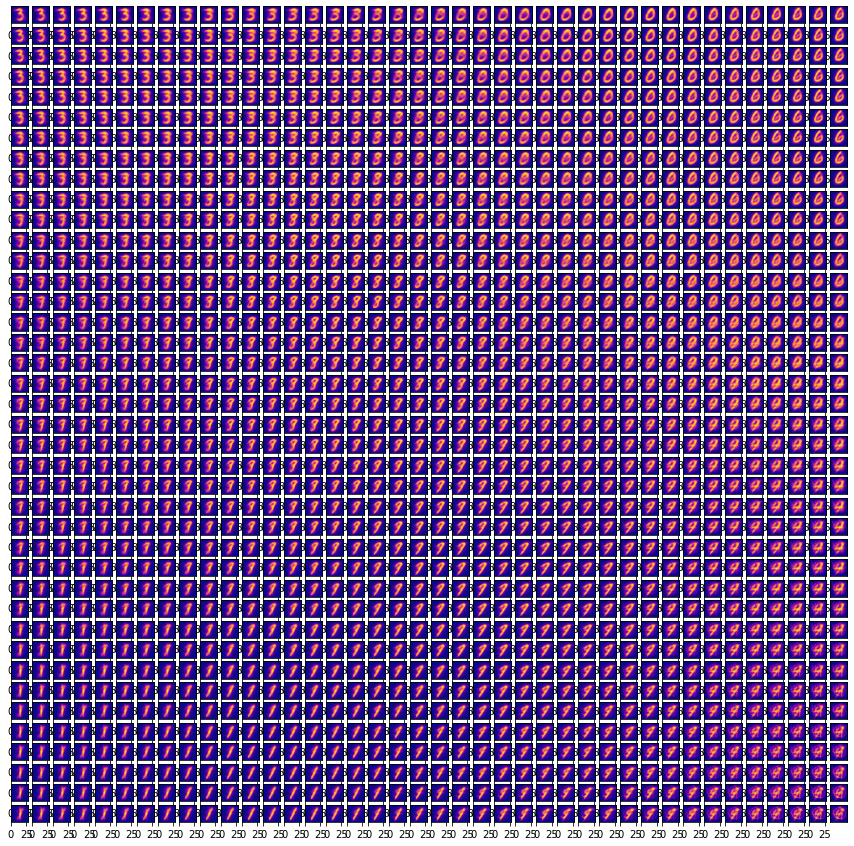

In [20]:
som_trained_40_40 = SOM([28,28],d_Train, ndim=40, nepochs=100, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)



SOM features before training: 


SOM intermediate  training: 


SOM features AFTER training: 



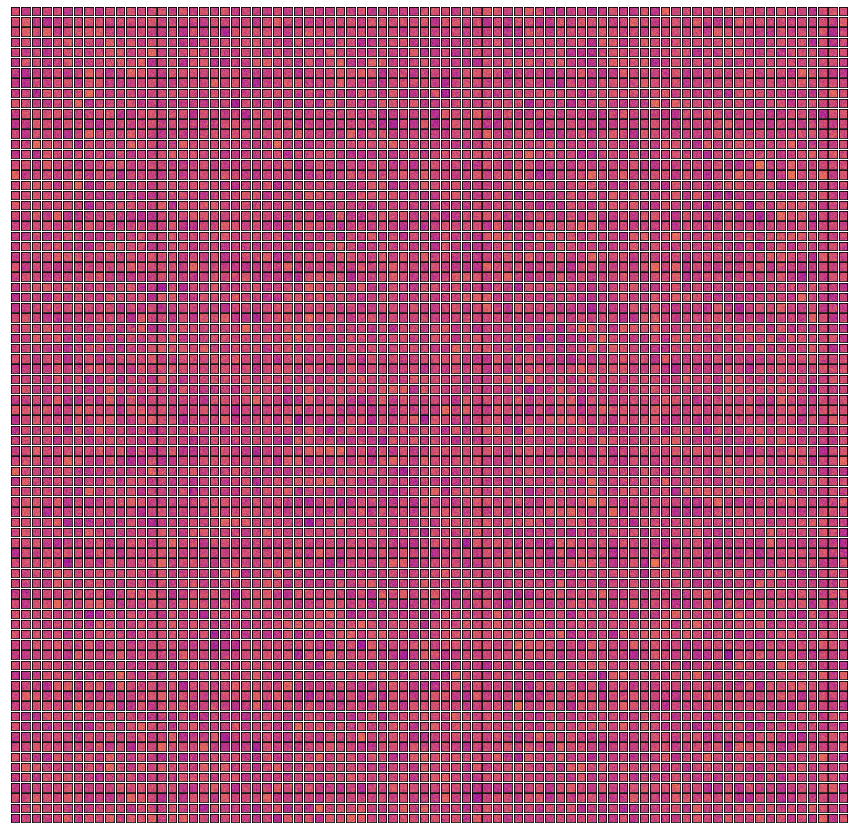

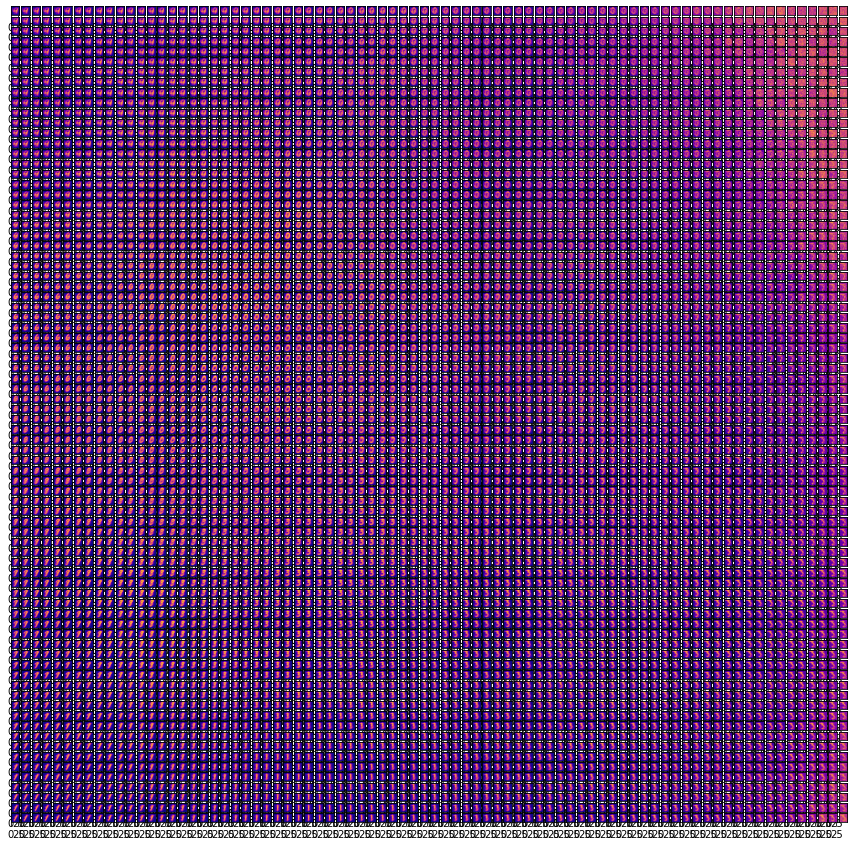

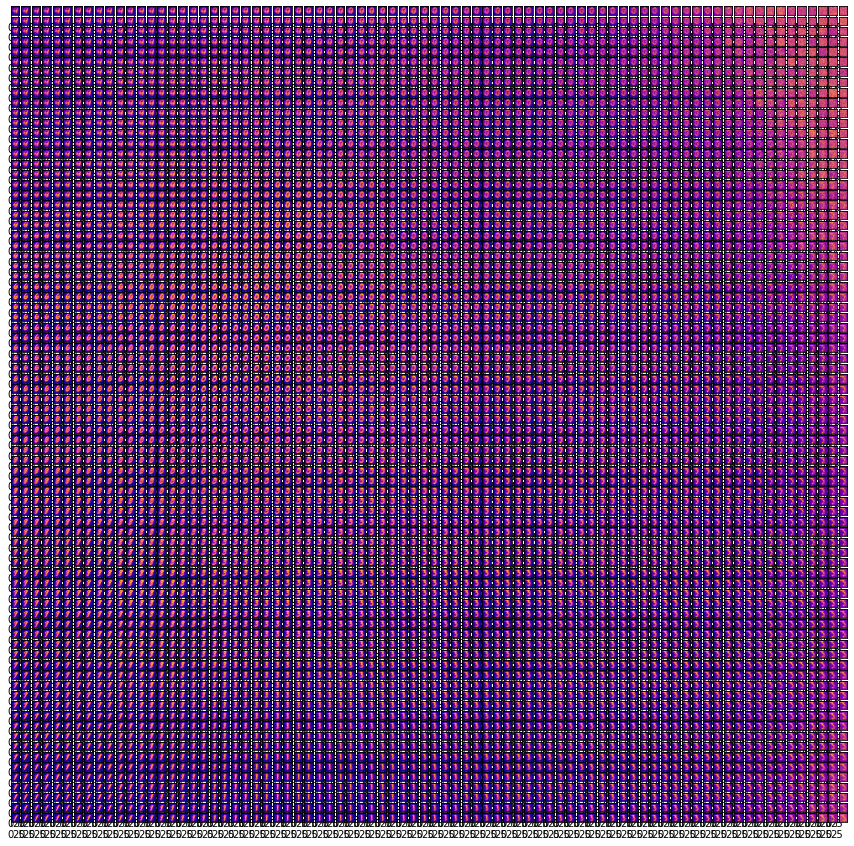

In [19]:
som_trained = SOM([28,28],d_Train, ndim=80, nepochs=100, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)


1.5
-----
20x20

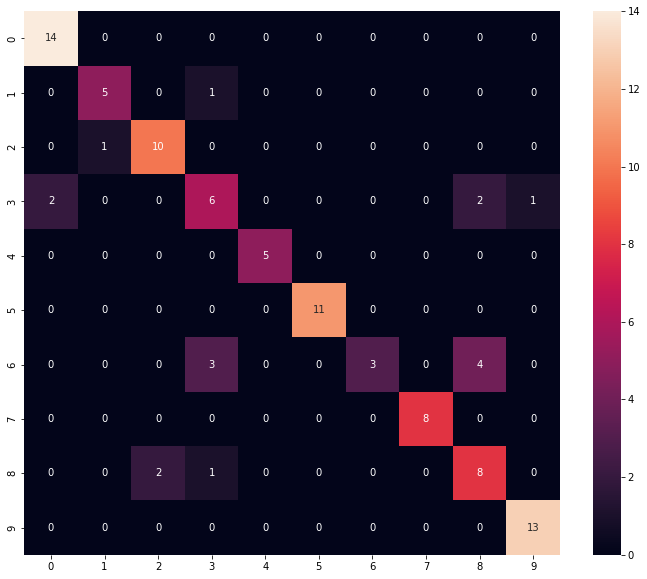

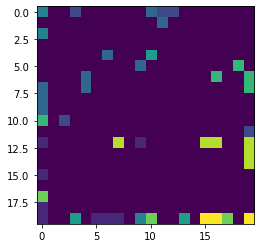

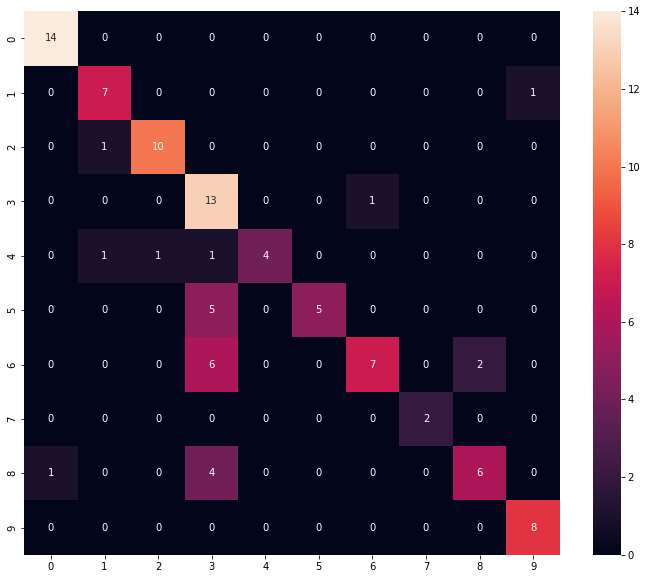

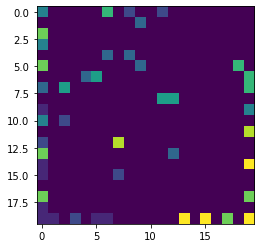

In [35]:
def confution_test(SOM, dataset, labels, ndim):
    grid_color=np.zeros((ndim,ndim))
    nclasses=np.max(labels)+1

    Confusion_Matrix=np.zeros((nclasses,nclasses))
    return SOM_Test(dataset, SOM, labels, grid_color, Confusion_Matrix, ndim)

def plot_confusion_matrix(confusion_matrix, nlabels):
    df_cm = pd.DataFrame(confusion_matrix, 
                index = [i for i in range(nlabels)],
                columns = [i for i in range(nlabels)])
    plt.figure(figsize=(12, 10))
    sns.heatmap(df_cm, annot=True)
    plt.show()



grid_color,Confusion_Matrix = confution_test(som_trained_20_20, d_Train, l_Train, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_Train) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

grid_color,Confusion_Matrix = confution_test(som_trained_20_20, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

40x40

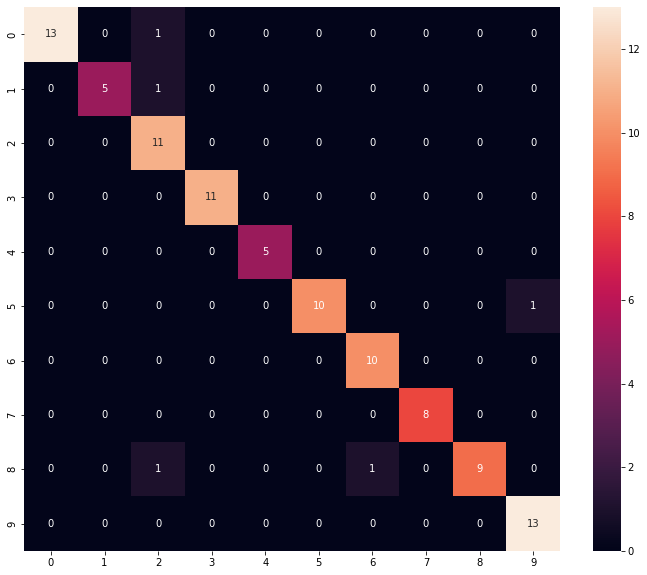

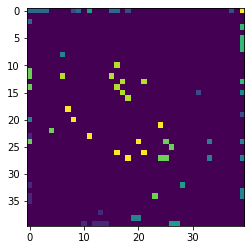

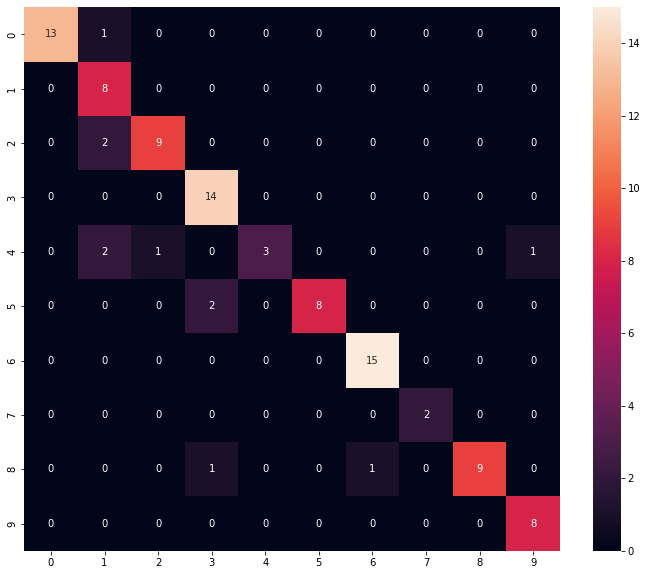

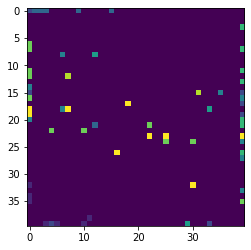

In [36]:
grid_color,Confusion_Matrix = confution_test(som_trained_40_40, d_Train, l_Train, 40)

plot_confusion_matrix(Confusion_Matrix, np.max(l_Train) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

grid_color,Confusion_Matrix = confution_test(som_trained_40_40, d_test, l_test, 40)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

80x80

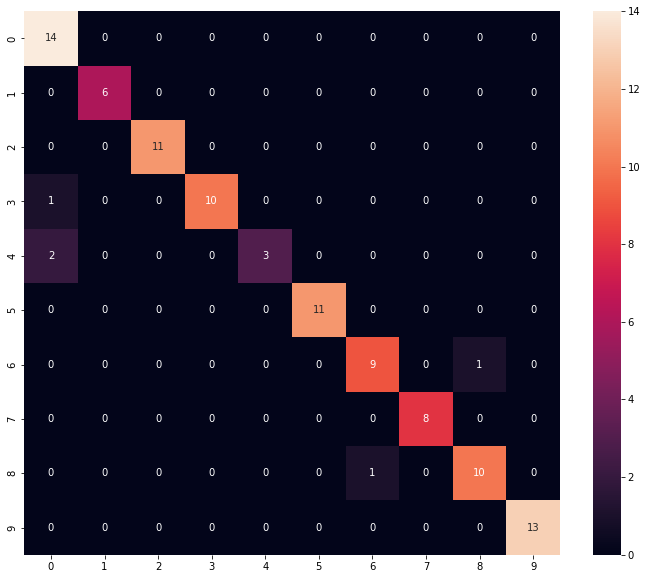

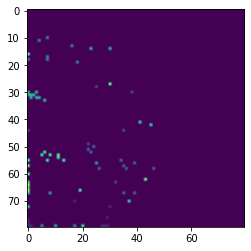

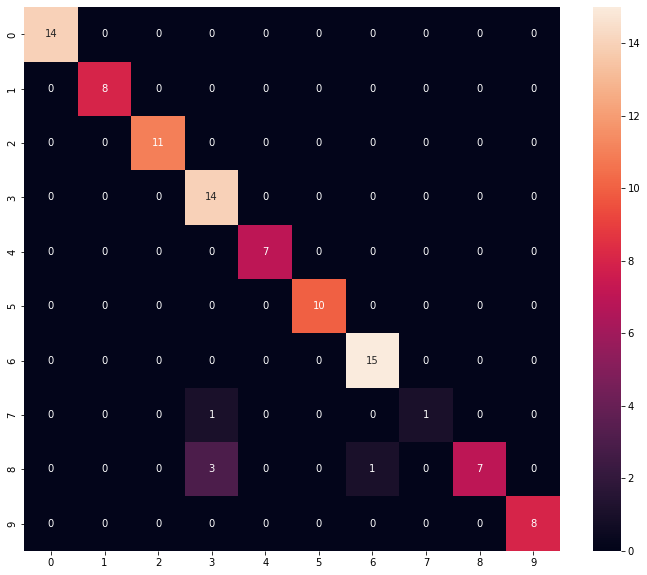

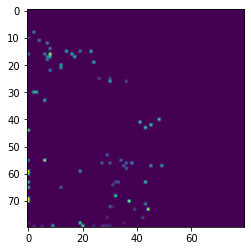

In [37]:
grid_color,Confusion_Matrix = confution_test(som_trained, d_Train, l_Train, 80)

plot_confusion_matrix(Confusion_Matrix, np.max(l_Train) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

grid_color,Confusion_Matrix = confution_test(som_trained, d_test, l_test, 80)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

1.6
------------
change the learning rate to 0.1

In [52]:
som_trained_20_20_lr1 = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0)


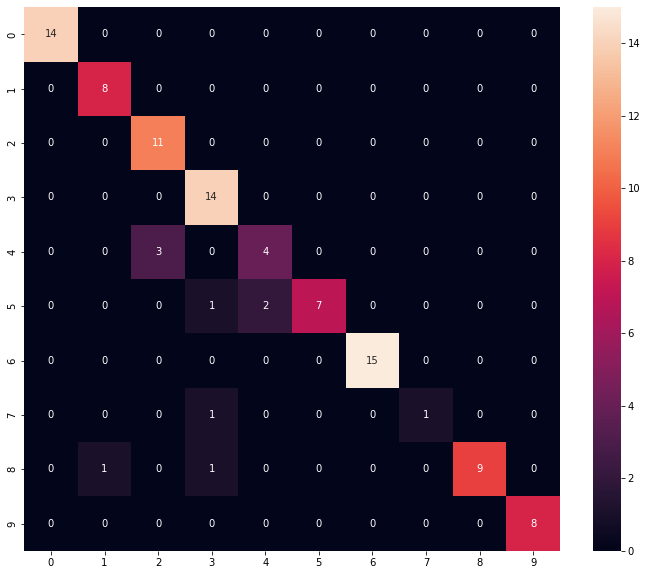

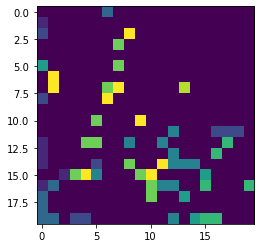

In [40]:
grid_color,Confusion_Matrix = confution_test(som_trained_20_20_lr1, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

learningrate 0.01

In [53]:
som_trained_20_20_lr001 = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=0.001, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0)


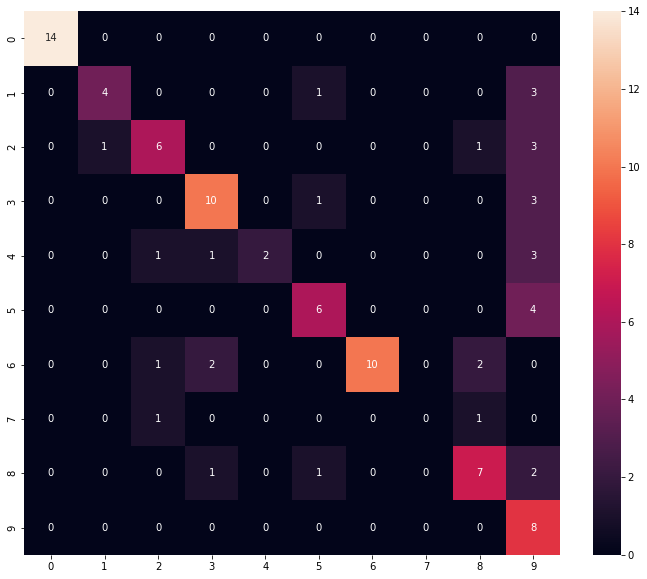

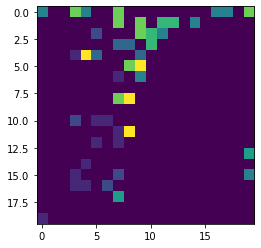

In [44]:
grid_color,Confusion_Matrix = confution_test(som_trained_20_20_lr001, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

learning rate one

In [54]:
som_trained_20_20_lrone = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0)


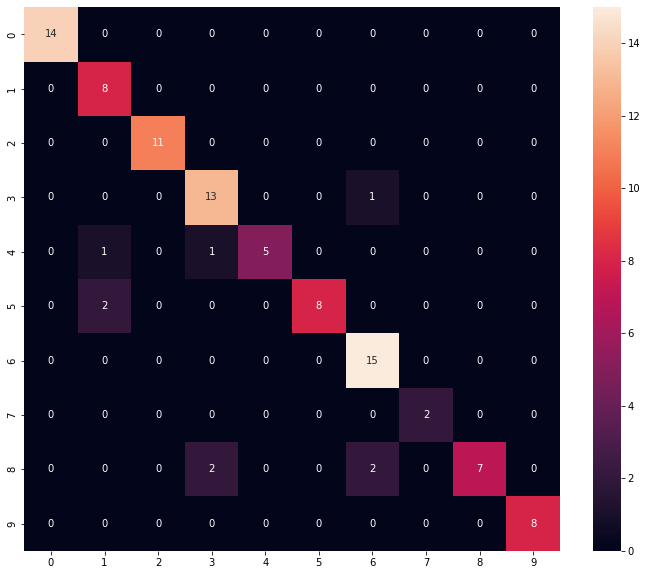

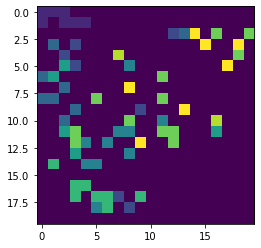

In [46]:
grid_color,Confusion_Matrix = confution_test(som_trained_20_20_lrone, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

In [55]:
som_trained_20_20_lr8 = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=8, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0)


C:\Users\olive\anaconda3\envs\D7041E_AAI\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\Users\olive\AppData\Local\Temp/ipykernel_6408/1089523351.py:5: RuntimeWarning: overflow encountered in square
  dist = (points - single_point)**2
C:\Users\olive\AppData\Local\Temp/ipykernel_6408/3446640039.py:69: RuntimeWarning: overflow encountered in multiply
  neighbourNeurons = neighbourNeurons + eta * G * (T - neighbourNeurons);
C:\Users\olive\AppData\Local\Temp/ipykernel_6408/3446640039.py:69: RuntimeWarning: invalid value encountered in add
  neighbourNeurons = neighbourNeurons + eta * G * (T - neighbourNeurons);


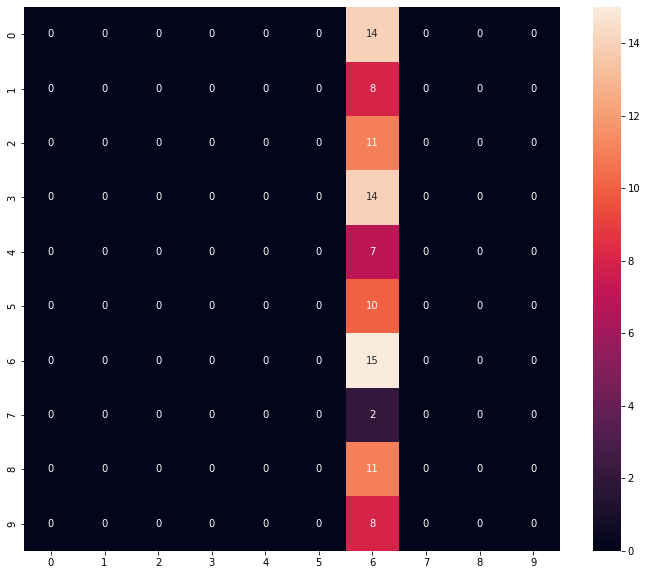

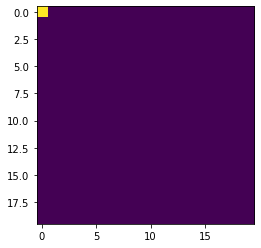

In [49]:
grid_color,Confusion_Matrix = confution_test(som_trained_20_20_lr8, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

The picked learningrate will in that case be 0.1. That seems to be a good value.


If the value is to small the value will take to long. The changes will be minimal and will need a longer time to train.

If the value is to big, then we come into the risk of over shotting the value so that we can't train the system. 

1.7
-------

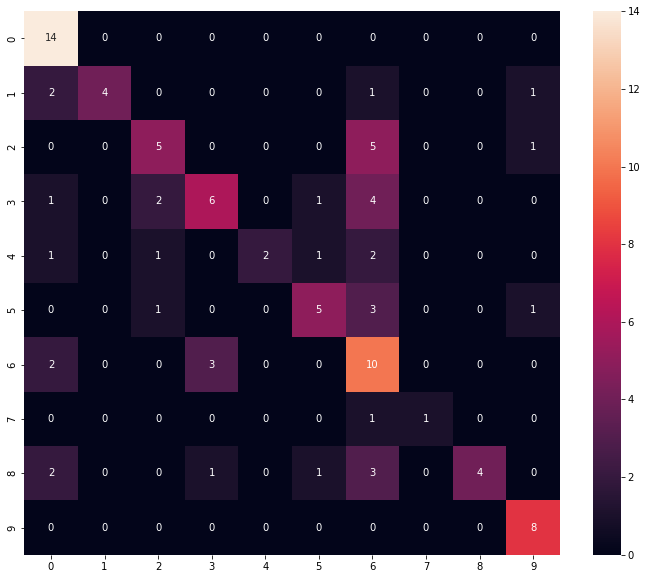

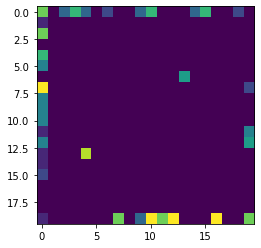

In [56]:
som_trained_20_20_decay = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=0.1, etadecay=0.5, sgm0=20, sgmdecay=0.05, showMode=0)

grid_color,Confusion_Matrix = confution_test(som_trained_20_20_decay, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

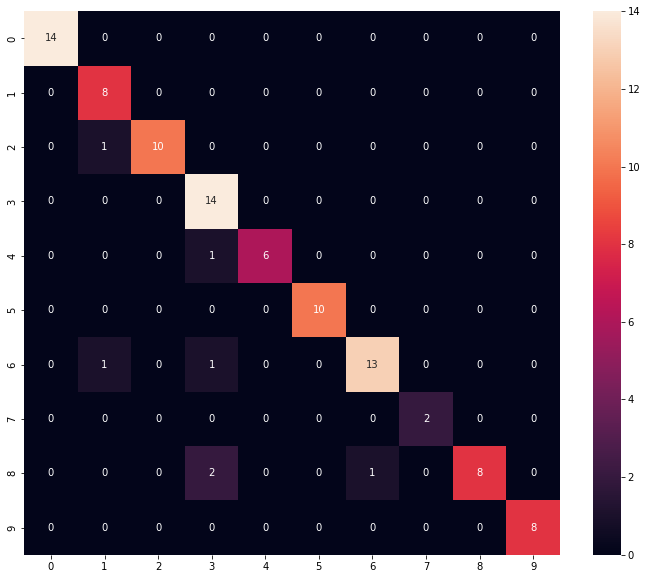

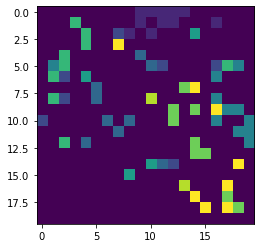

In [57]:
som_trained_20_20_decay0 = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=0.1, etadecay=0, sgm0=20, sgmdecay=0.05, showMode=0)

grid_color,Confusion_Matrix = confution_test(som_trained_20_20_decay0, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

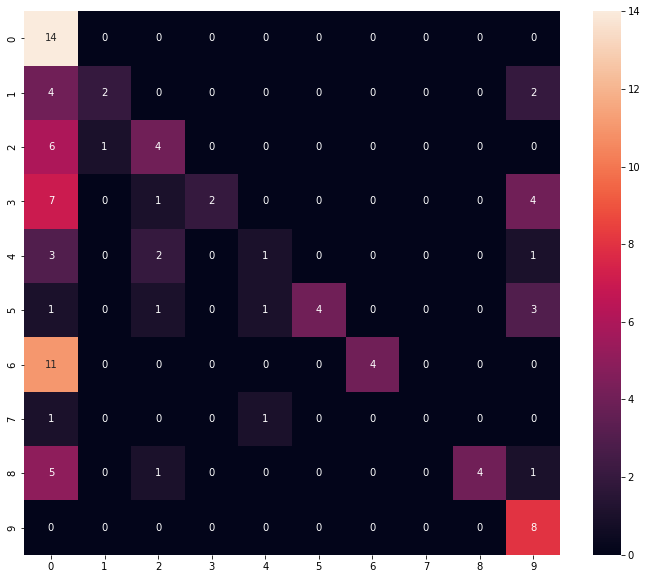

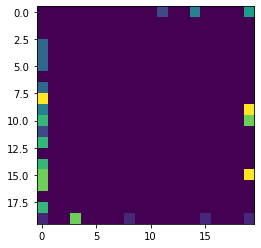

In [58]:
som_trained_20_20_decay1 = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=0.1, etadecay=1, sgm0=20, sgmdecay=0.05, showMode=0)

grid_color,Confusion_Matrix = confution_test(som_trained_20_20_decay1, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

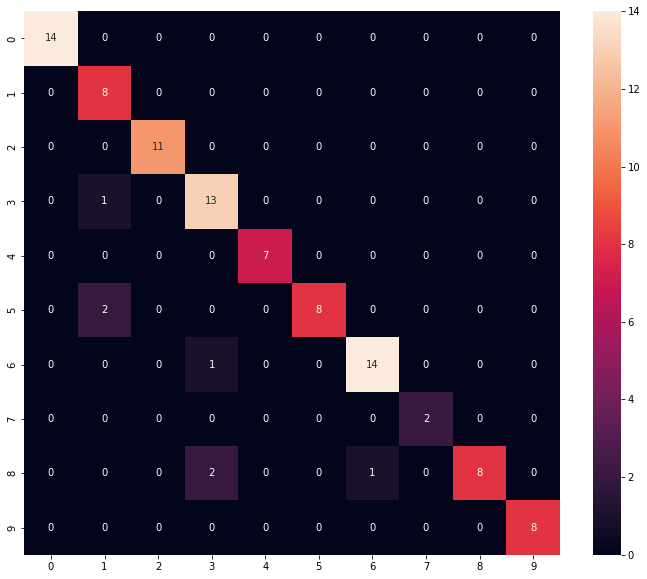

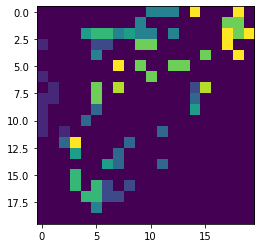

In [59]:
som_trained_20_20_decay05 = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=0.1, etadecay=0.005, sgm0=20, sgmdecay=0.05, showMode=0)

grid_color,Confusion_Matrix = confution_test(som_trained_20_20_decay05, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

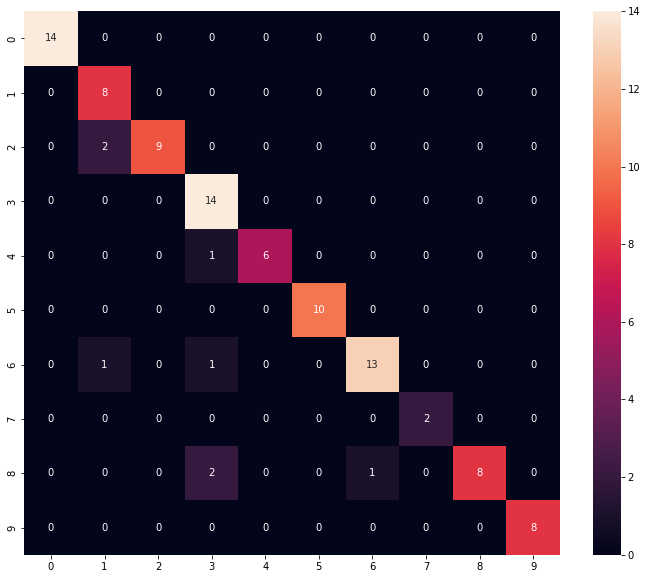

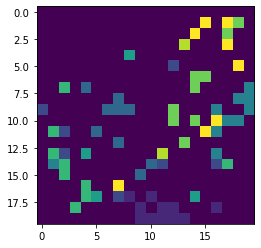

In [60]:
som_trained_20_20_decay005 = SOM([28,28],d_Train, ndim=20, nepochs=100, eta0=0.1, etadecay=0.0005, sgm0=20, sgmdecay=0.05, showMode=0)

grid_color,Confusion_Matrix = confution_test(som_trained_20_20_decay005, d_test, l_test, 20)

plot_confusion_matrix(Confusion_Matrix, np.max(l_test) + 1)

plt.close()
plt.imshow(grid_color)
plt.show()

We pick the value of 0.005 as the decay.

1.8
-------

As we lowered the decay the result got somewhat better. However when we made it higher, it became worse. This might be a result of a higher decay value will changing the learning rate more between each epoch.

1.9
-------

What is a biological neuron? 
1. A neuron is a made up of its dendrite, axion, main brain and so on. The neurons are the brains way of sending signals through its system.

How does it relate to the concept of neurons in SOM?
2. However, the difference between the biological neuron and the SOM neruon is as follows. The SOM neuron is a mathimathical eterpritation of the brains one.